[<img src="photutils_banner.svg" width=300>](http://photutils.readthedocs.io/en/stable/index.html)

# Aperture Photometry with `photutils`
---

##### What is aperture photometry?
The most common method to measure the flux from a celestial source is aperture photometry,. This kind of photometry measures the amount of flux within a region of defined shape and size (an aperture) surrounding a source. The ideal aperture would capture all of the flux emitted from the desired source, and none of the flux emitted from the surrounding sky or nearby sources. Especially when performing photometry on image data that includes a number of sources with varying size and shape, it is important to perform aperture corrections to account for imperfect apertures and better constrain photometric errors.

The `photutils` package provides tools for performing photometry with apertures of various shapes.

##### What does this tutorial include?
This tutorial covers how to perform aperture photometry with `photutils`, including the following methods:
* Creating Apertures
    * Circular Apertures
    * Elliptical Apertures
    * Sky (WCS) coordinates
    * Using Source Detection
* Performing Aperture Photometry
    * Center method
    * Subpixel method
    * With errors
    * Bad pixel masking
* Calculating Aperture Corrections

The methods demonstrated here are available in narrative form within the `photutils.aperture` [documentation](http://photutils.readthedocs.io/en/stable/aperture.html).

<div class="alert alert-block alert-warning">**Important:** Before proceeding, please be sure to install or update your [AstroConda](https://astroconda.readthedocs.io) distribution. This notebook may not work properly with older versions of AstroConda.</div>

---

## Import necessary packages

First, let's import packages that we will use to perform arithmetic functions and visualize data:

In [2]:
import numpy as np

from astropy.io import fits
import astropy.units as u
from astropy.nddata import CCDData
from astropy.stats import sigma_clipped_stats, SigmaClip
from astropy.visualization import ImageNormalize, LogStretch

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.ticker import LogLocator

from photutils.background import Background2D, MeanBackground

# Show plots in the notebook
% matplotlib inline

Let's also define some `matplotlib` parameters, such as title font size and the dpi, to make sure our plots look nice. To make it quick, we'll do this by loading a [prewritten style file](photutils_notebook_style.mplstyle) into `pyplot`. (See [here](https://matplotlib.org/users/customizing.html) to learn more about customizing `matplotlib`.)

In [3]:
plt.style.use('photutils_notebook_style.mplstyle')

## Retrieve data

For this example, we will be using Hubble eXtreme Deep Field (XDF) data, collecting using the Advanced Camera for Surveys (ACS) on Hubble between 2002 and 2012 and totalling 1.8 million seconds (500 hours!) of exposure time.

Since this file is too large to store on GitHub, we will just use astropy to directly download the file from the STScI archive: https://archive.stsci.edu/prepds/xdf/

In [5]:
url = 'https://archive.stsci.edu/pub/hlsp/xdf/hlsp_xdf_hst_acswfc-60mas_hudf_f435w_v1_sci.fits'
with fits.open(url) as hdulist:
    hdulist.info()
    data = hdulist[0].data
    header = hdulist[0].header

Filename: /Users/lchambers/.astropy/cache/download/py3/0e8dfa87b3e49367d836de86e28a40ec
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU      34   (5250, 5250)   float32   


As explained in the [previous notebook](01_photutils_background_estimation.ipynb) on background estimation, it is important to mask these data, as a large portion of the values are equal to zero. We will **mask** out the non-data, so all of those pixels that have a value of zero don't interfere with our statistics and analyses of the data. 

In [6]:
# Define the mask
mask = data == 0

Throughout this notebook, we are going to store our images in Python using a `CCDData` object (see [Astropy documentation](http://docs.astropy.org/en/stable/nddata/index.html#ccddata-class-for-images)), which contains a `numpy` array in addition to metadata such as uncertainty, masks, or units. In this case, our data is in electrons (counts) per second.

In [7]:
unit = u.ct / u.s
xdf_image = CCDData(data, unit=unit, meta=header, mask=mask)

Let's look at the data:

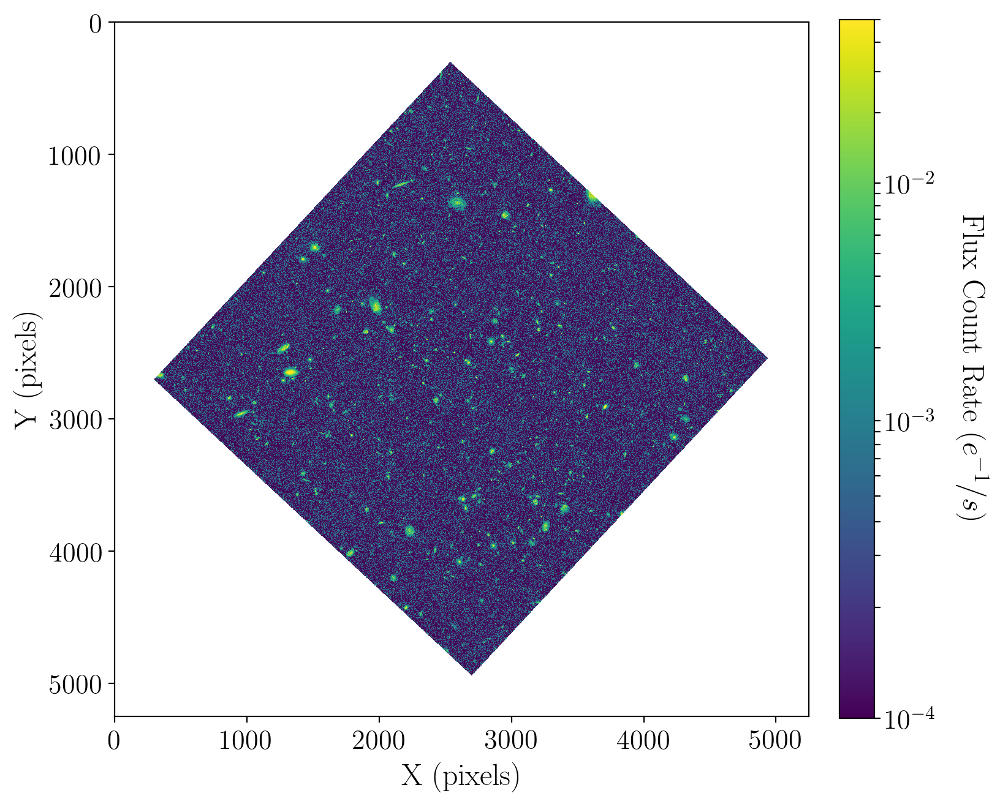

In [8]:
# Set up the figure with subplots
fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data
norm_image = ImageNormalize(vmin=1e-4, vmax=5e-2, stretch=LogStretch())
xdf_image_clipped = np.clip(xdf_image, 1e-4, None) # clip to plot with logarithmic stretch
fitsplot = ax1.imshow(np.ma.masked_where(xdf_image.mask, xdf_image_clipped), norm=norm_image)

# Define the colorbar and fix the labels
cbar = plt.colorbar(fitsplot, fraction=0.046, pad=0.04, ticks=LogLocator(subs=range(10)))
labels = ['$10^{-4}$'] + [''] * 8 + ['$10^{-3}$'] + [''] * 8 + ['$10^{-2}$']
cbar.ax.set_yticklabels(labels)

# Define labels
cbar.set_label(r'Flux Count Rate ($e^{-1}/s$)', rotation=270, labelpad=30)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')

plt.show()

---
## Creating Apertures

With `photutils`, users can create apertures with the following shapes:
<img src="apertures.png" width=700 alt="Examples of circular, elliptical, and rectangular apertures and annuli.">

Each of these can be defined either in pixel coordinates or in celestial coordinates (using a WCS transformation).

It is also possible for users to create custom aperture shapes.

Any aperture object is created by defining its position and size (and, if applicable, orientation). Let's use the `find_peaks` method that we learned about in the [previous notebook](02_photutils_source_detection.ipynb) to get the positions of sources in our data:

In [9]:
from photutils import find_peaks

In [11]:
# Calculate statistics
mean, median, std = sigma_clipped_stats(xdf_image.data, sigma=3.0, iters=5, mask=xdf_image.mask)

In [12]:
sources_findpeaks = find_peaks(xdf_image.data, mask=xdf_image.mask, 
                               threshold=20.*std, box_size=30, subpixel=True)    
print(sources_findpeaks)

x_peak y_peak peak_value   x_centroid    y_centroid   fit_peak_value 
------ ------ ---------- ------------- ------------- ----------------
  2525    393   0.135488 2525.26336319  393.52287379   0.148686232356
  2466    400  0.0293702 2465.79285007 398.043672132   0.017697209566
  2552    459  0.0183131 2552.29980281 458.682881159  0.0127956778906
  2614    463  0.0182303 2613.69616305 463.585067269  0.0188489099983
  2635    471  0.0211365 2634.95143383 470.852451697  0.0202923359649
  2635    493  0.0802742 2634.69820637  492.74148712   0.088501129426
  2678    496  0.0264142 2678.00830417 496.103740273  0.0231251189835
  2586    507  0.0371756 2585.55584313 507.289268775  0.0408303985988
  2326    554  0.0181343 2325.60993984 553.716519645  0.0163222094362
  2616    560  0.0214922 2615.88880869 559.974595634   0.018522455364
   ...    ...        ...           ...           ...              ...
  2531   4651  0.0174681 2530.65060271 4650.14639019  0.0144858084711
  2836   4662  0.018

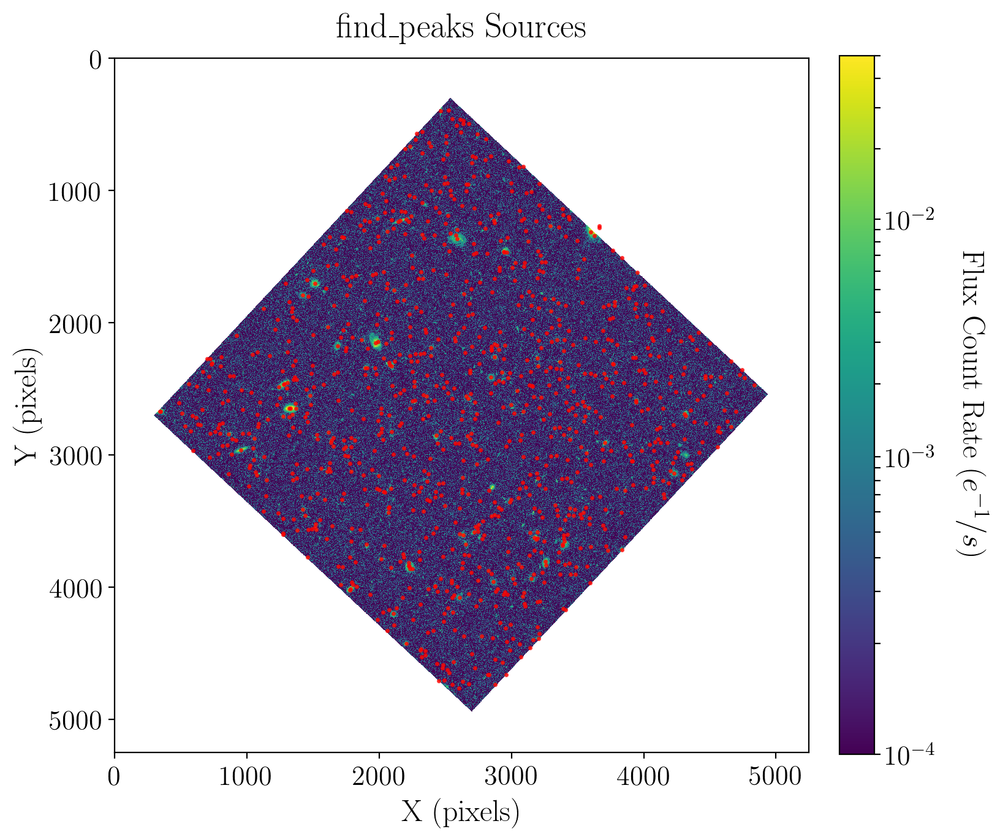

In [33]:
# Set up the figure with subplots
fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data
fitsplot = ax1.imshow(np.ma.masked_where(xdf_image.mask, xdf_image_clipped), norm=norm_image)
ax1.scatter(sources_findpeaks['x_centroid'], sources_findpeaks['y_centroid'], s=10, marker='.', 
            lw=1, alpha=0.7, color='r')#facecolor='None', edgecolor='r')

# Define the colorbar
cbar = plt.colorbar(fitsplot, fraction=0.046, pad=0.04, ticks=LogLocator(subs=range(10)))
labels = ['$10^{-4}$'] + [''] * 8 + ['$10^{-3}$'] + [''] * 8 + ['$10^{-2}$']
cbar.ax.set_yticklabels(labels)

# Define labels
cbar.set_label(r'Flux Count Rate ($e^{-1}/s$)', rotation=270, labelpad=30)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('find\_peaks Sources')

plt.show()

### Circular Apertures

In [18]:
from photutils import CircularAperture

In [90]:
# define the aperture
position = (sources_findpeaks['x_centroid'], sources_findpeaks['y_centroid'])
radius = 10.
circular_aperture = CircularAperture(position, r=radius)

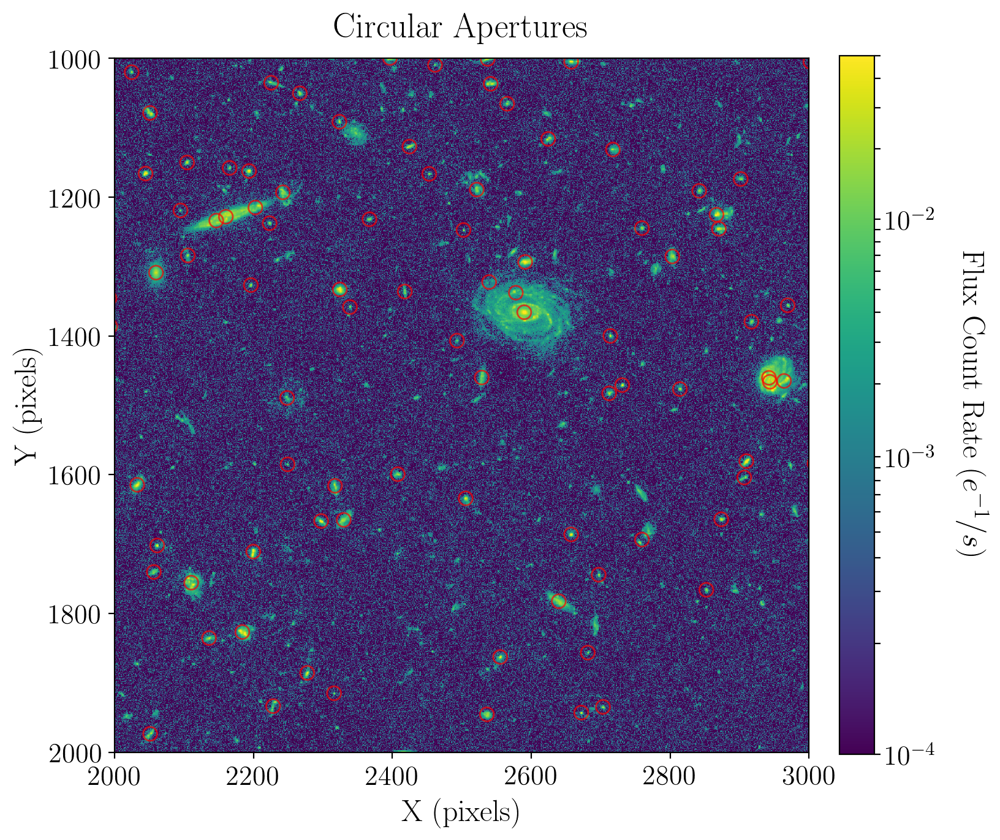

In [91]:
# Set up the figure with subplots
fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data
fitsplot = ax1.imshow(np.ma.masked_where(xdf_image.mask, xdf_image_clipped), norm=norm_image)

# Plot the apertures
circular_aperture.plot(color='red', alpha=0.7)

# Define the colorbar
cbar = plt.colorbar(fitsplot, fraction=0.046, pad=0.04, ticks=LogLocator(subs=range(10)))
labels = ['$10^{-4}$'] + [''] * 8 + ['$10^{-3}$'] + [''] * 8 + ['$10^{-2}$']
cbar.ax.set_yticklabels(labels)

# Define labels
cbar.set_label(r'Flux Count Rate ($e^{-1}/s$)', rotation=270, labelpad=30)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('Circular Apertures')

# Crop to show an inset of the data
ax1.set_xlim(2000, 3000)
ax1.set_ylim(2000, 1000)

plt.show()

As you can see, these circular apertures don't fit our data very well. After all, this is the Hubble eXtreme Deep Field, so there aren't any single stars in this image! Let's use ellipses instead to better match the morphology of each galaxy.

### Elliptical Apertures

In [56]:
from photutils import detect_sources, source_properties, EllipticalAnnulus, EllipticalAperture

In [38]:
# Define threshold and minimum object size
threshold = 5. * std
npixels = 15

# Create a segmentation image
segm = detect_sources(xdf_image.data, threshold, npixels)

# Create a catalog using source properties
catalog = source_properties(xdf_image.data, segm)
table = catalog.to_table()
print(table)

 id      xcentroid      ...         cxy                  cyy         
            pix         ...       1 / pix2             1 / pix2      
---- ------------------ ... -------------------- --------------------
   1 2465.6563851369983 ...  0.06586117853274677 0.007718700495270243
   2 2525.7146682862567 ...  -0.4550949855071517   0.7234921982823534
   3 2552.2117255592093 ...  -0.2532160317243995   0.6564821929840179
   4   2613.63719128523 ...   0.0830362050293753   0.8983772637003175
   5  2634.674993705567 ...  0.19169454941634784   1.5831018426475838
   6 2678.1091188199425 ...  -1.1539569187642806   1.0029644256476158
   7 2585.6085374714853 ...  0.22735601208579106   1.2150447289121327
   8 2616.0955067306063 ...  -0.3080147577844529    0.369822234483922
   9 2743.1885611302587 ...  0.09697072664950096  0.02799777839477976
  10 2289.1810436855694 ...   1.0625618996024824   1.6310668301378817
 ...                ... ...                  ...                  ...
1182 2452.0729469668

In [92]:
r = 3.  # approximate isophotal extent of semimajor axis

# Create the apertures
elliptical_apertures = []
for obj in catalog:
    position = (obj.xcentroid.value, obj.ycentroid.value)
    a = obj.semimajor_axis_sigma.value * r
    b = obj.semiminor_axis_sigma.value * r
    theta = obj.orientation.value
    elliptical_apertures.append(EllipticalAperture(position, a, b, theta=theta))

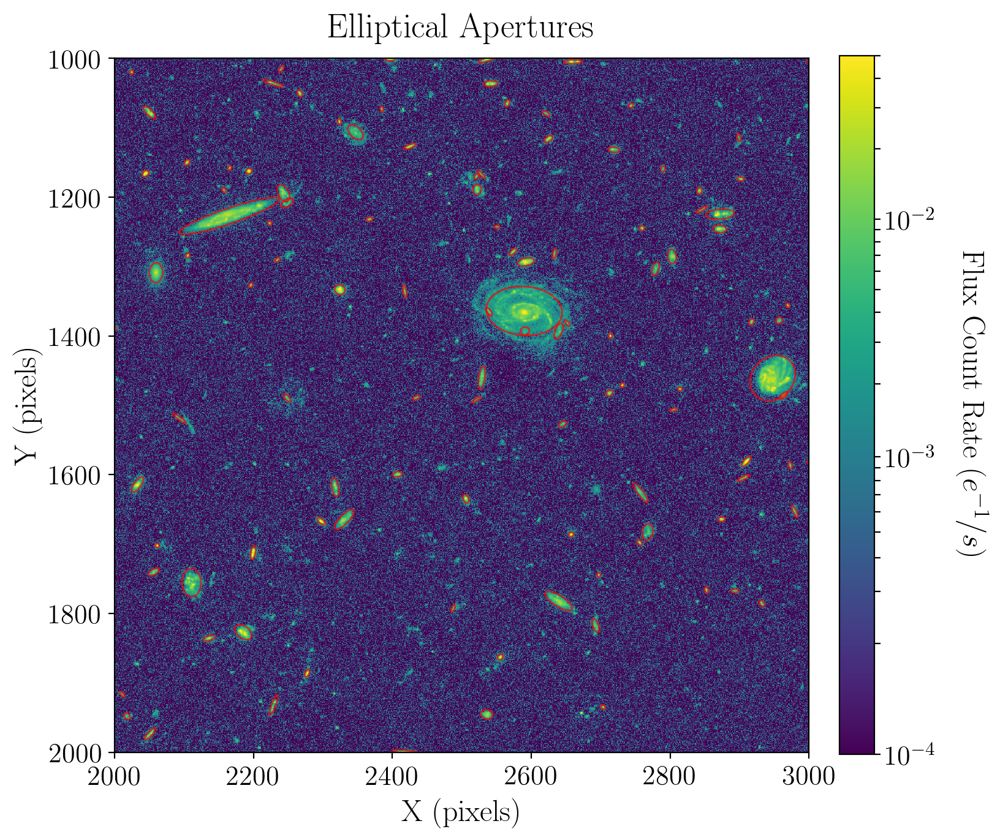

In [93]:
# Set up the figure with subplots
fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data
fitsplot = ax1.imshow(np.ma.masked_where(xdf_image.mask, xdf_image_clipped), norm=norm_image)

# Plot the apertures
for aperture in elliptical_apertures:
    aperture.plot(color='red', alpha=0.7, ax=ax1)

# Define the colorbar
cbar = plt.colorbar(fitsplot, fraction=0.046, pad=0.04, ticks=LogLocator(subs=range(10)))
labels = ['$10^{-4}$'] + [''] * 8 + ['$10^{-3}$'] + [''] * 8 + ['$10^{-2}$']
cbar.ax.set_yticklabels(labels)

# Define labels
cbar.set_label(r'Flux Count Rate ($e^{-1}/s$)', rotation=270, labelpad=30)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('Elliptical Apertures')

# Crop to show an inset of the data
ax1.set_xlim(2000, 3000)
ax1.set_ylim(2000, 1000)

plt.show()

### Sky Coordinates

In [ ]:
# define circular aperture using sky coordinates# defin 
from photutils import SkyCircularAperture
radius2 = 5. * u.pix   # sky aperture radius must be a Quantity
sky_apers = SkyCircularAperture(coord, r=radius2)

----
## Performing Aperture Photometry

Now that we have aperture objects that fit our data reasonably well, we can finally perform photometry with the `aperture_photometry` function. This function takes the following arguments:
* **`data`** - the background-subtracted data array one which to perform photometry.
* **`apertures`** - an aperture object containing the aperture(s) to use for the photometry.
* **`error`** (optional) - an array of values that represent the pixel-wise Gaussian 1-sigma errors of the input data.
* **`mask`** (optional) - a mask for the `data` to exclude certain pixels from calculations.
* **`method`** (optional) - how to place the aperture(s) onto the pixel grid (see below).
* **`unit`** (optional) - unit of `data` and `error`.
* **`wcs`** (optional) - the WCS transformation to use if `apertures` is a SkyAperture object. 
* **`subpixels`** (optional) - the factor by which pixels are resampled (see below).

The following methods are the options for how to place apertures onto the data pixel grid:

* "exact" (default) - calculate the exact fractional overlap of each aperture for each overlapping pixel. This method is the most accurate, but will also take the longest. 
* "center" - a pixel is either entirely in or entirely out of the aperture, depending on whether the pixel center is inside or outside of the aperture.
* "subpixel" - a pixel is divided into `subpixels` x `subpixels` subpixels, each of which are considered to be entirely in or out of the aperture depending on whether its center is in or out of the aperture. 

In [69]:
from photutils import aperture_photometry
from astropy.table import QTable

In [68]:
phot_table = aperture_photometry(xdf_image, elliptical_apertures[0])
print(phot_table)    

 id      xcenter            ycenter          aperture_sum  
           pix                pix               ct / s     
--- ------------------ ------------------ -----------------
  1 2465.6563851369983 400.81800680167044 3.759414096293263


However, the `aperture_photometry` function can be only used alone for one of the two cases:
* Identical apertures at distinct positions (e.g. circular apertures with r = 3 for many sources)
* Distinct apertures at identical positions (e.g. two circular apertures with r = 3 and r = 5 for one source)

Since our elliptical apertures are distinct apertures at distinct positions, we need to do a little more work to get a single table of photometric values.

(This step will take a while, so hang tight!)

In [88]:
phot_table = aperture_photometry(xdf_image, elliptical_apertures[0])
id = 1
for aperture in elliptical_apertures[1:]:
    id += 1
    phot_row = aperture_photometry(xdf_image, aperture)[0]
    phot_row[0] = id
    phot_table.add_row(phot_row)

In [89]:
print(phot_table)

 id       xcenter            ycenter           aperture_sum   
            pix                pix                ct / s      
---- ------------------ ------------------ -------------------
   1 2465.6563851369983 400.81800680167044   3.759414096293263
   2 2525.7146682862567 393.73989347255696  1.2492025062635352
   3 2552.2117255592093  458.5137810049479  0.5065438325866949
   4   2613.63719128523    463.66938580469 0.23491451815017383
   5  2634.674993705567 492.72340664080383  0.4026443726547825
   6 2678.1091188199425  496.2035761476186 0.23247877568845507
   7 2585.6085374714853  507.3150036427311 0.33343883490776643
   8 2616.0955067306063  559.9008019868303  0.9309469517148878
   9 2743.1885611302587  577.6332040156127  2.6680113727266317
  10 2289.1810436855694  567.4625569990363  0.1923980852747567
 ...                ...                ...                 ...
1182 2452.0729469668836  4710.102258753783  0.3432569273380445
1183 2630.7610532202093  4711.965099310494 0.4604034609

### Subpixel Method

In [ ]:
phot = aperture_photometry(data, aperture,  method='subpixel', subpixels=5)

### Using Sky Coordinates

In [ ]:
phot2 = aperture_photometry(data, sky_apers, wcs=wcs)


### With Errors

In [ ]:
error = xdf_image.data * 0.05
phot = aperture_photometry(data, aperture, error=error)

### Bad Pixel Masking

In [ ]:
# mask the bad pixel
mask = np.zeros_like(data2, dtype=bool)
mask[y, x] = True
aperture_photometry(data2, apertures, error=error, mask=mask)

## Local Background Subtraction

In [52]:
r_in = 3.  # approximate isophotal extent of inner semimajor axis
r_out = 5.  # approximate isophotal extent of inner semimajor axis

# Create the apertures
elliptical_annuli = []
for obj in catalog:
    position = (obj.xcentroid.value, obj.ycentroid.value)
    a_in = obj.semimajor_axis_sigma.value * r_in
    a_out = obj.semimajor_axis_sigma.value * r_out
    b_out = obj.semiminor_axis_sigma.value * r_out
    theta = obj.orientation.value
    elliptical_annuli.append(EllipticalAnnulus(position, a_in, a_out, b_out, theta=theta))

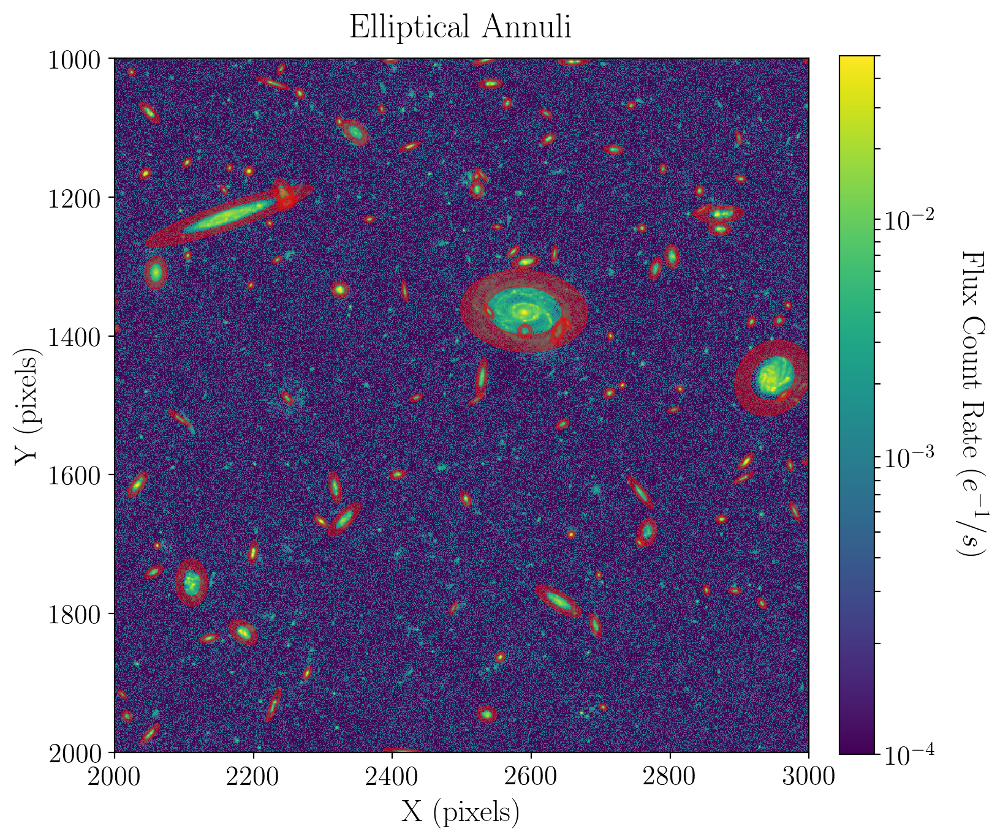

In [63]:
# Set up the figure with subplots
fig, ax1 = plt.subplots(1, 1, figsize=(8, 8))

# Plot the data
fitsplot = ax1.imshow(np.ma.masked_where(xdf_image.mask, xdf_image_clipped), norm=norm_image)

# Plot the apertures
for aperture in elliptical_annuli:
    aperture.plot(color='red', alpha=0.4, ax=ax1, fill=True)

# Define the colorbar
cbar = plt.colorbar(fitsplot, fraction=0.046, pad=0.04, ticks=LogLocator(subs=range(10)))
labels = ['$10^{-4}$'] + [''] * 8 + ['$10^{-3}$'] + [''] * 8 + ['$10^{-2}$']
cbar.ax.set_yticklabels(labels)

# Define labels
cbar.set_label(r'Flux Count Rate ($e^{-1}/s$)', rotation=270, labelpad=30)
ax1.set_xlabel('X (pixels)')
ax1.set_ylabel('Y (pixels)')
ax1.set_title('Elliptical Annuli')

# Crop to show an inset of the data
ax1.set_xlim(2000, 3000)
ax1.set_ylim(2000, 1000)

plt.show()

## Calculating Aperture Corrections

In [ ]:
# multiple apertures at a single position
radii = np.linspace(0.1, 20, 100)
flux = []
for r in radii:
    ap = CircularAperture(positions[0], r=r)
    phot = aperture_photometry(data, ap)
    flux.append(phot['aperture_sum'][0])
    
plt.plot(radii, flux)
plt.title('Encircled Flux')
plt.xlabel('Radius (pixels)')
plt.ylabel('Aperture Sum ($e^{-1}/s$)')

In [ ]:
bkg_apertures = CircularAnnulus(positions, r_in=10., r_out=15.)

# measure the aperture sums in both apertures# measu 
phot = aperture_photometry(data, apertures)
bkg = aperture_photometry(data, bkg_apertures)


# calculate the mean background level (per pixel) in the annuli# calcu 
bkg_mean = bkg['aperture_sum'] / bkg_apertures.area()
bkg_mean

# now calculate the total background in the circular aperture
bkg_sum = bkg_mean * apertures.area()

phot['bkg_sum'] = bkg_sum
phot

# subtract the background
flux_bkgsub = phot['aperture_sum'] - bkg_sum

phot['aperture_sum_bkgsub'] = flux_bkgsub
phot

Calculate the F160W AB magnitude of the source at $x$=34.61, $y$=137.99 in a $r$=7 pixel (0.42 arcsec) circular aperture.

---
##### To continue with this `photutils` tutorial, go on to the [psf photometry notebook](04_photutils_psf_photometry.ipynb).

---
<i>August 2018

Author: Lauren Chambers (lchambers@stsci.edu)

For more examples and details, please visit the [photutils](http://photutils.readthedocs.io/en/stable/index.html) documentation.</i>